# Model Making
Here I will be prototyping the UNet Model, with Lidar data with a voxel representation.

Full Credit to Guido Zuidhof's notebook for the voxelization methods and functions.

In [1]:
# !pip install shapely -U
# Lyft_SDK
# !pip install lyft-dataset-sdk

### Creating Folders:
Our code will generate artifacts while training, so we need to put them somewhere.

In [2]:
import os.path
# Our code will generate data, visualization and model checkpoints
input_path = '/media/brendanliu/1ffe4965-0a76-4845-aedc-1929d41a1cde/lyft_lidar/3d-object-detection-for-autonomous-vehicles/'
image_path = './image/'
artifacts_folder = input_path + "artifacts"

Getting all the libraries that we need in either to do our modelfitting.

In [3]:
from datetime import datetime
from functools import partial
import glob
from multiprocessing import Pool

# Disable multiprocesing for numpy/opencv. We already multiprocess ourselves, this would mean every subprocess produces
# even more threads which would lead to a lot of context switching, slowing things down a lot.
import os
os.environ["OMP_NUM_THREADS"] = "1"

import matplotlib.pyplot as plt
%matplotlib inline

import pandas as pd
import cv2
from PIL import Image
import numpy as np
from tqdm import tqdm, tqdm_notebook
import scipy
import scipy.ndimage
import scipy.special
from scipy.spatial.transform import Rotation as R

from lyft_dataset_sdk.lyftdataset import LyftDataset
from lyft_dataset_sdk.utils.data_classes import LidarPointCloud, Box, Quaternion
from lyft_dataset_sdk.utils.geometry_utils import view_points, transform_matrix

Using the lyft SDK to load in the lidar and 2D image dataset.

In [4]:
level5data = LyftDataset(data_path=input_path, json_path=input_path + 'train_data', verbose=True)
os.makedirs(artifacts_folder, exist_ok=True)

9 category,
18 attribute,
4 visibility,
18421 instance,
10 sensor,
148 calibrated_sensor,
177789 ego_pose,
180 log,
180 scene,
22680 sample,
189504 sample_data,
638179 sample_annotation,
1 map,
Done loading in 11.3 seconds.
Reverse indexing ...
Done reverse indexing in 2.0 seconds.


In [5]:
classes = ["car", "motorcycle", "bus", "bicycle", "truck", "pedestrian", "other_vehicle", "animal", "emergency_vehicle"]

In [6]:
# getting samples from level5data
records = [(level5data.get('sample', record['first_sample_token'])['timestamp'], record) for record in level5data.scene]

entries = []

for start_time, record in sorted(records):
    start_time = level5data.get('sample', record['first_sample_token'])['timestamp'] / 1000000

    token = record['token']
    name = record['name']
    date = datetime.utcfromtimestamp(start_time)
    host = "-".join(record['name'].split("-")[:2])
    first_sample_token = record["first_sample_token"]

    entries.append((host, name, date, token, first_sample_token))
            
df = pd.DataFrame(entries, columns=["host", "scene_name", "date", "scene_token", "first_sample_token"])

In [7]:
#looking 
host_count_df = df.groupby("host")['scene_token'].count()
print(host_count_df)

host
host-a004    42
host-a005     1
host-a006     3
host-a007    26
host-a008     5
host-a009     9
host-a011    51
host-a012     2
host-a015     6
host-a017     3
host-a101    20
host-a102    12
Name: scene_token, dtype: int64


## Splitting Into Training and Validation Sets

One can split training and validation sets via many ways: scenes, date, etc... We validate by car here, or hosts.

In [8]:
#use three cars for validation
validation_hosts = ["host-a007", "host-a008", "host-a009"]

In [9]:
validation_df = df[df["host"].isin(validation_hosts)]
vi = validation_df.index
train_df = df[~df.index.isin(vi)]

print("There are {0} training samples and {1} validation samples.".format(len(train_df), len(validation_df)))

There are 140 training samples and 40 validation samples.


### EDA with the first sample token
I just select the first sample token to see the lidar data and use Guido's matrix to voxel space funtions to transform the lidar point data.

In [10]:
#taking the first sample token, using .get to get values
sample_token = train_df.first_sample_token.values[0]
sample = level5data.get("sample", sample_token)

sample_lidar_token = sample["data"]["LIDAR_TOP"]
lidar_data = level5data.get("sample_data", sample_lidar_token)
lidar_filepath = level5data.get_sample_data_path(sample_lidar_token)

ego_pose = level5data.get("ego_pose", lidar_data["ego_pose_token"])
calibrated_sensor = level5data.get("calibrated_sensor", lidar_data["calibrated_sensor_token"])

# Homogeneous transformation matrix from car frame to world frame.
global_from_car = transform_matrix(ego_pose['translation'],
                                   Quaternion(ego_pose['rotation']), inverse=False)

# Homogeneous transformation matrix from sensor coordinate frame to ego car frame.
car_from_sensor = transform_matrix(calibrated_sensor['translation'], Quaternion(calibrated_sensor['rotation']),
                                    inverse=False)

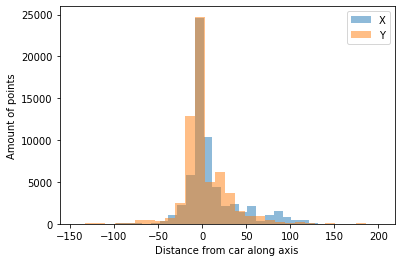

In [11]:
lidar_pointcloud = LidarPointCloud.from_file(lidar_filepath)

# The lidar pointcloud is defined in the sensor's reference frame.
# We want it in the car's reference frame, so we transform each point
lidar_pointcloud.transform(car_from_sensor)

# A sanity check, the points should be centered around 0 in car space.
plt.hist(lidar_pointcloud.points[0], alpha=0.5, bins=30, label="X")
plt.hist(lidar_pointcloud.points[1], alpha=0.5, bins=30, label="Y")
plt.legend()
plt.xlabel("Distance from car along axis")
plt.ylabel("Amount of points")
plt.show()

In [12]:
def create_transformation_matrix_to_voxel_space(shape, voxel_size, offset):
    """
    Constructs a transformation matrix given an output voxel shape such that (0,0,0) ends up in the center.
    Voxel_size defines how large every voxel is in world coordinate, (1,1,1) would be the same as Minecraft voxels.
    
    An offset per axis in world coordinates (metric) can be provided, this is useful for Z (up-down) in lidar points.
    """
    
    shape, voxel_size, offset = np.array(shape), np.array(voxel_size), np.array(offset)
    
    # Return a 2-D array size 4 with ones on the diagonal and zeros elsewhere.
    tm = np.eye(4, dtype=np.float32)
    translation = shape/2 + offset/voxel_size
    
    tm = tm * np.array(np.hstack((1/voxel_size, [1])))
    tm[:3, 3] = np.transpose(translation)
    return tm

def transform_points(points, transf_matrix):
    """
    Transform (3,N) or (4,N) points using transformation matrix.
    """
    if points.shape[0] not in [3,4]:
        raise Exception("Points input should be (3,N) or (4,N) shape, received {}".format(points.shape))
    return transf_matrix.dot(np.vstack((points[:3, :], np.ones(points.shape[1]))))[:3, :]

In [13]:
def car_to_voxel_coords(points, shape, voxel_size, z_offset=0):
    if len(shape) != 3:
        raise Exception("Voxel volume shape should be 3 dimensions (x,y,z)")
        
    if len(points.shape) != 2 or points.shape[0] not in [3, 4]:
        raise Exception("Input points should be (3,N) or (4,N) in shape, found {}".format(points.shape))

    tm = create_transformation_matrix_to_voxel_space(shape, voxel_size, (0, 0, z_offset))
    p = transform_points(points, tm)
    return p

def create_voxel_pointcloud(points, shape, voxel_size=(0.5,0.5,1), z_offset=0):

    points_voxel_coords = car_to_voxel_coords(points.copy(), shape, voxel_size, z_offset)
    points_voxel_coords = points_voxel_coords[:3].transpose(1,0)
    points_voxel_coords = np.int0(points_voxel_coords)
    
    bev = np.zeros(shape, dtype=np.float32)
    bev_shape = np.array(shape)

    within_bounds = (np.all(points_voxel_coords >= 0, axis=1) * np.all(points_voxel_coords < bev_shape, axis=1))
    
    points_voxel_coords = points_voxel_coords[within_bounds]
    coord, count = np.unique(points_voxel_coords, axis=0, return_counts=True)
        
    # Note X and Y are flipped:
    bev[coord[:,1], coord[:,0], coord[:,2]] = count
    
    return bev

def normalize_voxel_intensities(bev, max_intensity=16):
    return (bev/max_intensity).clip(0,1)


voxel_size = (0.4,0.4,1.5)
z_offset = -2.0
bev_shape = (336, 336, 3)

# bev = birds eye view
bev = create_voxel_pointcloud(lidar_pointcloud.points, bev_shape, voxel_size=voxel_size, z_offset=z_offset)

# So that the values in the voxels range from 0,1 we set a maximum intensity.
bev = normalize_voxel_intensities(bev)

'A voxel represents a single sample, or data point, on a regularly spaced, three-dimensional grid. This data point can consist of a single piece of data, such as an opacity, or multiple pieces of data, such as a color in addition to opacity. A voxel represents only a single point on this grid, not a volume; the space between each voxel is not represented in a voxel-based dataset. Depending on the type of data and the intended use for the dataset, this missing information may be reconstructed and/or approximated, e.g. via interpolation.'

The value of a voxel may represent various properties. Here each voxel stores the height of the lidar data separated into three bins, which are visualized like RGB channels in an image in  a birds eye view(bev).

Voxels can contain multiple scalar values, essentially vector (tensor) data; in the case of ultrasound scans with B-mode and Doppler data, density, and volumetric flow rate are captured as separate channels of data relating to the same voxel positions.

Here it is used to represent the height of our lidar data for our CNN to train on.

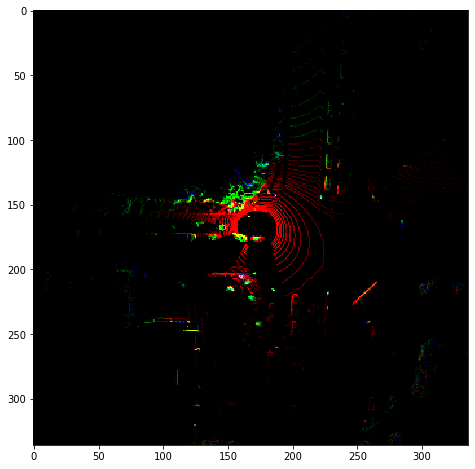

In [14]:
plt.figure(figsize=(16,8))
plt.imshow(bev)
plt.show()

We need to get the bounding boxes for the targets from the lyft dataset. Then we need to translate and rotate the boxes to get them into car space. Then we scale and draw them.

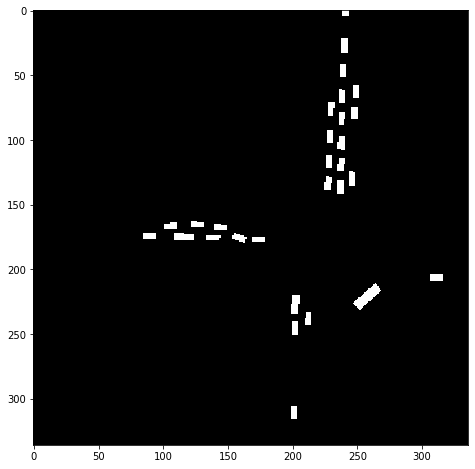

In [15]:
boxes = level5data.get_boxes(sample_lidar_token)

target_im = np.zeros(bev.shape[:3], dtype=np.uint8)

def move_boxes_to_car_space(boxes, ego_pose):
    """
    Move boxes from world space to car space.
    Note: mutates input boxes.
    """
    translation = -np.array(ego_pose['translation'])
    rotation = Quaternion(ego_pose['rotation']).inverse
    
    for box in boxes:
        # Bring box to car space
        box.translate(translation)
        box.rotate(rotation)
        
def scale_boxes(boxes, factor):
    """
    Note: mutates input boxes
    """
    for box in boxes:
        box.wlh = box.wlh * factor

def draw_boxes(im, voxel_size, boxes, classes, z_offset=0.0):
    for box in boxes:
        # We only care about the bottom corners
        corners = box.bottom_corners()
        corners_voxel = car_to_voxel_coords(corners, im.shape, voxel_size, z_offset).transpose(1,0)
        corners_voxel = corners_voxel[:,:2] # Drop z coord

        class_color = classes.index(box.name) + 1
        
        if class_color == 0:
            raise Exception("Unknown class: {}".format(box.name))

        cv2.drawContours(im, np.int0([corners_voxel]), 0, (class_color, class_color, class_color), -1)



move_boxes_to_car_space(boxes, ego_pose)
scale_boxes(boxes, 0.8)
draw_boxes(target_im, voxel_size, boxes, classes, z_offset=z_offset)

plt.figure(figsize=(8,8))
plt.imshow((target_im > 0).astype(np.float32), cmap='Set2')
plt.show()

I used the method .render_sample_data to look at the lidar with bounding boxes. 

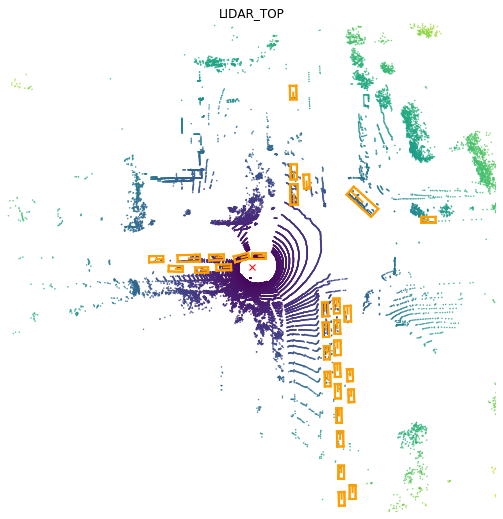

In [16]:
def visualize_lidar_of_sample(sample_token, axes_limit=80):
    sample = level5data.get("sample", sample_token)
    sample_lidar_token = sample["data"]["LIDAR_TOP"]
    level5data.render_sample_data(sample_lidar_token, axes_limit=axes_limit)
    
# Don't worry about it being mirrored.
visualize_lidar_of_sample(sample_token)

In [17]:
del bev, lidar_pointcloud, boxes

In [18]:
# Some hyperparameters we'll need to define for the system
voxel_size = (0.4, 0.4, 1.5)
z_offset = -2.0
bev_shape = (336, 336, 3)

# We scale down each box so they are more separated when projected into our coarse voxel space.
box_scale = 0.8

In [19]:
train_data_folder = os.path.join(artifacts_folder, "bev_train_data")
validation_data_folder = os.path.join(artifacts_folder, "bev_validation_data")

We need to now prepare all traning data in order and by car.

In [20]:
NUM_WORKERS = os.cpu_count() * 3

def prepare_training_data_for_scene(first_sample_token, output_folder, bev_shape, voxel_size, z_offset, box_scale):
    """
    Given a first sample token (in a scene), output rasterized input volumes and targets in birds-eye-view perspective.

    """
    sample_token = first_sample_token
    
    while sample_token:
        
        sample = level5data.get("sample", sample_token)

        sample_lidar_token = sample["data"]["LIDAR_TOP"]
        lidar_data = level5data.get("sample_data", sample_lidar_token)
        lidar_filepath = level5data.get_sample_data_path(sample_lidar_token)

        ego_pose = level5data.get("ego_pose", lidar_data["ego_pose_token"])
        calibrated_sensor = level5data.get("calibrated_sensor", lidar_data["calibrated_sensor_token"])


        global_from_car = transform_matrix(ego_pose['translation'],
                                           Quaternion(ego_pose['rotation']), inverse=False)

        car_from_sensor = transform_matrix(calibrated_sensor['translation'], Quaternion(calibrated_sensor['rotation']),
                                            inverse=False)

        try:
            lidar_pointcloud = LidarPointCloud.from_file(lidar_filepath)
            lidar_pointcloud.transform(car_from_sensor)
        except Exception as e:
            print ("Failed to load Lidar Pointcloud for {}: {}:".format(sample_token, e))
            sample_token = sample["next"]
            continue
        
        bev = create_voxel_pointcloud(lidar_pointcloud.points, bev_shape, voxel_size=voxel_size, z_offset=z_offset)
        bev = normalize_voxel_intensities(bev)

        
        boxes = level5data.get_boxes(sample_lidar_token)

        target = np.zeros_like(bev)

        move_boxes_to_car_space(boxes, ego_pose)
        scale_boxes(boxes, box_scale)
        draw_boxes(target, voxel_size, boxes=boxes, classes=classes, z_offset=z_offset)

        bev_im = np.round(bev*255).astype(np.uint8)
        target_im = target[:,:,0] # take one channel only

        cv2.imwrite(os.path.join(output_folder, "{}_input.png".format(sample_token)), bev_im)
        cv2.imwrite(os.path.join(output_folder, "{}_target.png".format(sample_token)), target_im)
        
        sample_token = sample["next"]

for df, data_folder in [(train_df, train_data_folder), (validation_df, validation_data_folder)]:
    print("Preparing data into {} using {} workers".format(data_folder, NUM_WORKERS))
    first_samples = df.first_sample_token.values

    os.makedirs(data_folder, exist_ok=True)
    
    process_func = partial(prepare_training_data_for_scene,
                           output_folder=data_folder, bev_shape=bev_shape, voxel_size=voxel_size, z_offset=z_offset, box_scale=box_scale)

    pool = Pool(NUM_WORKERS)
    for _ in tqdm_notebook(pool.imap_unordered(process_func, first_samples), total=len(first_samples)):
        pass
    pool.close()
    del pool

Preparing data into /media/brendanliu/1ffe4965-0a76-4845-aedc-1929d41a1cde/lyft_lidar/3d-object-detection-for-autonomous-vehicles/artifacts/bev_train_data using 24 workers


Failed to load Lidar Pointcloud for 9cb04b1a4d476fd0782431764c7b55e91c6dbcbc6197c3dab3e044f13d058011: cannot reshape array of size 265728 into shape (5):

Preparing data into /media/brendanliu/1ffe4965-0a76-4845-aedc-1929d41a1cde/lyft_lidar/3d-object-detection-for-autonomous-vehicles/artifacts/bev_validation_data using 24 workers


## Training our network to segment objects. 
image segmentation is the process of partitioning a digital image into multiple segments (sets of pixels, also known as image objects). The goal of segmentation is to simplify and/or change the representation of an image into something that is more meaningful and easier to analyze. 

Linda G. Shapiro and George C. Stockman (2001): “Computer Vision”, pp 279-325, New Jersey, Prentice-Hall

Here we load in the data that was created before and then create a pytorch dataset.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


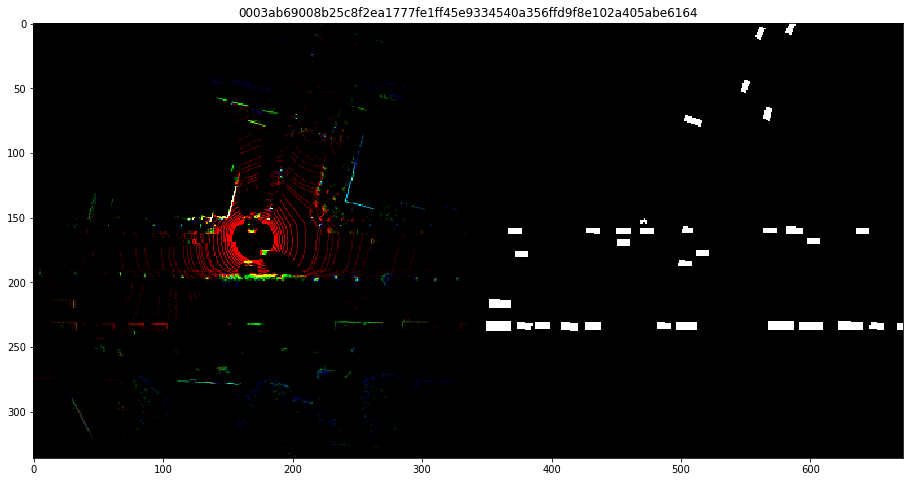

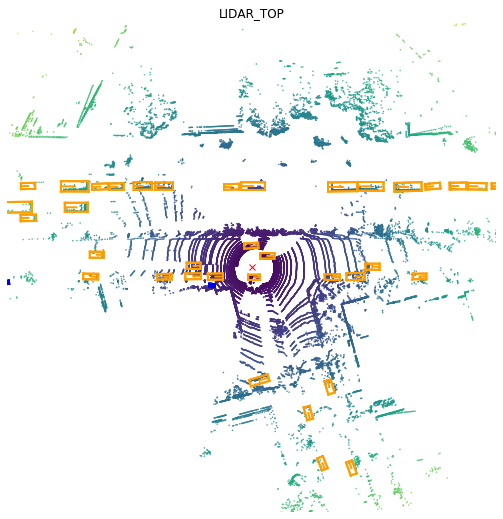

In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data

class BEVImageDataset(torch.utils.data.Dataset):
    def __init__(self, input_filepaths, target_filepaths, map_filepaths=None):
        self.input_filepaths = input_filepaths
        self.target_filepaths = target_filepaths
        self.map_filepaths = map_filepaths
        
        if map_filepaths is not None:
            assert len(input_filepaths) == len(map_filepaths)
        
        assert len(input_filepaths) == len(target_filepaths)

    def __len__(self):
        return len(self.input_filepaths)

    def __getitem__(self, idx):
        input_filepath = self.input_filepaths[idx]
        target_filepath = self.target_filepaths[idx]
        
        sample_token = input_filepath.split("/")[-1].replace("_input.png","")
        
        im = cv2.imread(input_filepath, cv2.IMREAD_UNCHANGED)
        
        if self.map_filepaths:
            map_filepath = self.map_filepaths[idx]
            map_im = cv2.imread(map_filepath, cv2.IMREAD_UNCHANGED)
            im = np.concatenate((im, map_im), axis=2)
        
        target = cv2.imread(target_filepath, cv2.IMREAD_UNCHANGED)
        
        im = im.astype(np.float32)/255
        target = target.astype(np.int64)
        
        im = torch.from_numpy(im.transpose(2,0,1))
        target = torch.from_numpy(target)
        
        return im, target, sample_token

input_filepaths = sorted(glob.glob(os.path.join(train_data_folder, "*_input.png")))
target_filepaths = sorted(glob.glob(os.path.join(train_data_folder, "*_target.png")))

train_dataset = BEVImageDataset(input_filepaths, target_filepaths)
    
im, target, sample_token = train_dataset[1]
im = im.numpy()
target = target.numpy()

plt.figure(figsize=(16,8))

target_as_rgb = np.repeat(target[...,None], 3, 2)
# Transpose the input volume CXY to XYC order, which is what matplotlib requires.
plt.imshow(np.hstack((im.transpose(1,2,0)[...,:3], target_as_rgb)))
plt.title(sample_token)
plt.show()

visualize_lidar_of_sample(sample_token)

In [22]:
# This implementation was copied from https://github.com/jvanvugt/pytorch-unet, it is MIT licensed.
class UNet(nn.Module):
    def __init__(
        self,
        in_channels=1,
        n_classes=2,
        depth=5,
        wf=6,
        padding=False,
        batch_norm=False,
        up_mode='upconv',
    ):
        """
        Implementation of
        U-Net: Convolutional Networks for Biomedical Image Segmentation
        (Ronneberger et al., 2015)
        https://arxiv.org/abs/1505.04597
        Using the default arguments will yield the exact version used
        in the original paper
        Args:
            in_channels (int): number of input channels
            n_classes (int): number of output channels
            depth (int): depth of the network
            wf (int): number of filters in the first layer is 2**wf
            padding (bool): if True, apply padding such that the input shape
                            is the same as the output.
                            This may introduce artifacts
            batch_norm (bool): Use BatchNorm after layers with an
                               activation function
            up_mode (str): one of 'upconv' or 'upsample'.
                           'upconv' will use transposed convolutions for
                           learned upsampling.
                           'upsample' will use bilinear upsampling.
        """
        super(UNet, self).__init__()
        assert up_mode in ('upconv', 'upsample')
        self.padding = padding
        self.depth = depth
        prev_channels = in_channels
        self.down_path = nn.ModuleList()
        for i in range(depth):
            self.down_path.append(
                UNetConvBlock(prev_channels, 2 ** (wf + i), padding, batch_norm)
            )
            prev_channels = 2 ** (wf + i)

        self.up_path = nn.ModuleList()
        for i in reversed(range(depth - 1)):
            self.up_path.append(
                UNetUpBlock(prev_channels, 2 ** (wf + i), up_mode, padding, batch_norm)
            )
            prev_channels = 2 ** (wf + i)

        self.last = nn.Conv2d(prev_channels, n_classes, kernel_size=1)

    def forward(self, x):
        blocks = []
        for i, down in enumerate(self.down_path):
            x = down(x)
            if i != len(self.down_path) - 1:
                blocks.append(x)
                x = F.max_pool2d(x, 2)

        for i, up in enumerate(self.up_path):
            x = up(x, blocks[-i - 1])

        return self.last(x)


class UNetConvBlock(nn.Module):
    def __init__(self, in_size, out_size, padding, batch_norm):
        super(UNetConvBlock, self).__init__()
        block = []

        block.append(nn.Conv2d(in_size, out_size, kernel_size=3, padding=int(padding)))
        block.append(nn.ReLU())
        if batch_norm:
            block.append(nn.BatchNorm2d(out_size))

        block.append(nn.Conv2d(out_size, out_size, kernel_size=3, padding=int(padding)))
        block.append(nn.ReLU())
        if batch_norm:
            block.append(nn.BatchNorm2d(out_size))

        self.block = nn.Sequential(*block)

    def forward(self, x):
        out = self.block(x)
        return out


class UNetUpBlock(nn.Module):
    def __init__(self, in_size, out_size, up_mode, padding, batch_norm):
        super(UNetUpBlock, self).__init__()
        if up_mode == 'upconv':
            self.up = nn.ConvTranspose2d(in_size, out_size, kernel_size=2, stride=2)
        elif up_mode == 'upsample':
            self.up = nn.Sequential(
                nn.Upsample(mode='bilinear', scale_factor=2),
                nn.Conv2d(in_size, out_size, kernel_size=1),
            )

        self.conv_block = UNetConvBlock(in_size, out_size, padding, batch_norm)

    def center_crop(self, layer, target_size):
        _, _, layer_height, layer_width = layer.size()
        diff_y = (layer_height - target_size[0]) // 2
        diff_x = (layer_width - target_size[1]) // 2
        return layer[
            :, :, diff_y : (diff_y + target_size[0]), diff_x : (diff_x + target_size[1])
        ]

    def forward(self, x, bridge):
        up = self.up(x)
        crop1 = self.center_crop(bridge, up.shape[2:])
        out = torch.cat([up, crop1], 1)
        out = self.conv_block(out)

        return out

## Training Model:

In [23]:
def get_unet_model(in_channels=3, num_output_classes=2):
    '''
    Method to get UNet model with default settings.
    
    We use wf = 6,
    depth = 5,
    and up_mode = 'upconv' to get the results in the paper linked above.
    '''
    model = UNet(in_channels=in_channels, n_classes=num_output_classes, wf=6, depth=5, padding=True, up_mode='upconv')
    # Optional, for multi GPU training and inference
    model = nn.DataParallel(model)
    return model

In [24]:
def visualize_predictions(input_image, prediction, target, n_images=2, apply_softmax=True):
    """
    Takes as input 3 PyTorch tensors, plots the input image, predictions and targets.
    """
    # Only select the first n images
    prediction = prediction[:n_images]
    target = target[:n_images]
    input_image = input_image[:n_images]

    prediction = prediction.detach().cpu().numpy()
    if apply_softmax:
        prediction = scipy.special.softmax(prediction, axis=1)
    class_one_preds = np.hstack(1-prediction[:,0])

    target = np.hstack(target.detach().cpu().numpy())

    class_rgb = np.repeat(class_one_preds[..., None], 3, axis=2)
    class_rgb[...,2] = 0
    class_rgb[...,1] = target

    
    input_im = np.hstack(input_image.cpu().numpy().transpose(0,2,3,1))
    
    if input_im.shape[2] == 3:
        input_im_grayscale = np.repeat(input_im.mean(axis=2)[..., None], 3, axis=2)
        overlayed_im = (input_im_grayscale*0.6 + class_rgb*0.7).clip(0,1)
    else:
        input_map = input_im[...,3:]
        overlayed_im = (input_map*0.6 + class_rgb*0.7).clip(0,1)

    thresholded_pred = np.repeat(class_one_preds[..., None] > 0.5, 3, axis=2)

    fig = plt.figure(figsize=(12,26))
    plot_im = np.vstack([class_rgb, input_im[...,:3], overlayed_im, thresholded_pred]).clip(0,1).astype(np.float32)
    plt.imshow(plot_im)
    plt.axis("off")
    plt.show()

## Setup cuda Device for training
I initially ran for 50 epochs with batch size 8, and decided that 25 epochs is enough.

WARNING: I have a 1080Ti, and batch sizes over 8 took too much gpu memory and crashed my computer

In [25]:
# We weigh the loss for the 0 class lower to account for (some of) the big class imbalance.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
class_weights = torch.from_numpy(np.array([0.2] + [1.0]*len(classes), dtype=np.float32))
class_weights = class_weights.to(device)

Epoch 1


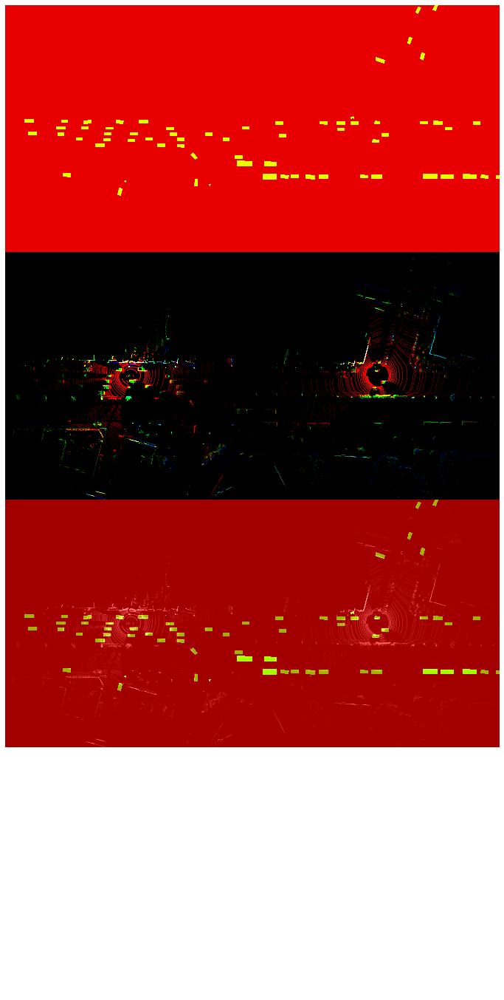


Loss: 0.18408929
Epoch 2


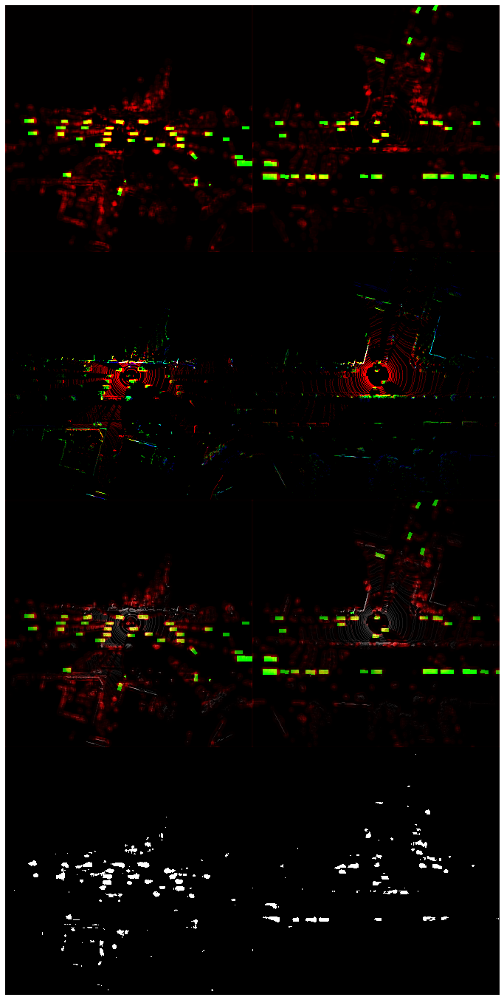


Loss: 0.1427658
Epoch 3


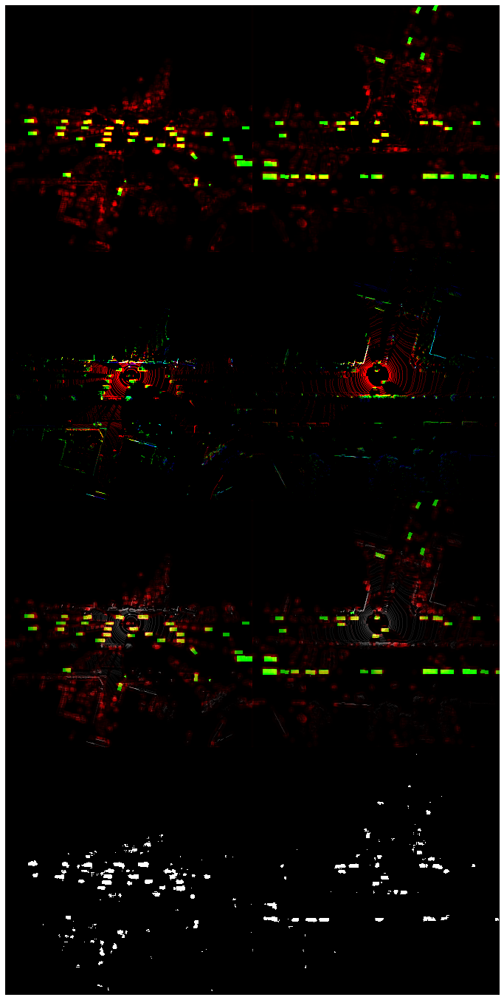


Loss: 0.13346449
Epoch 4


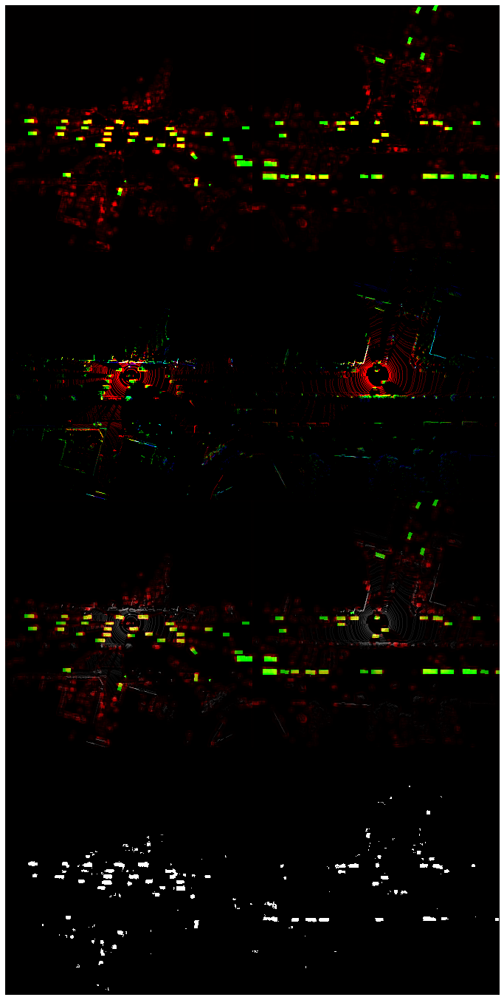


Loss: 0.12863839
Epoch 5


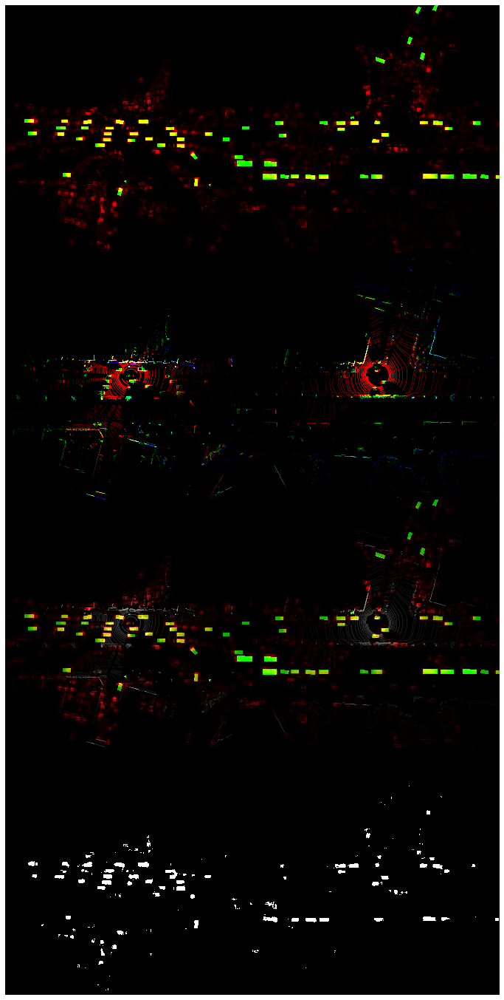


Loss: 0.12546231
Epoch 6


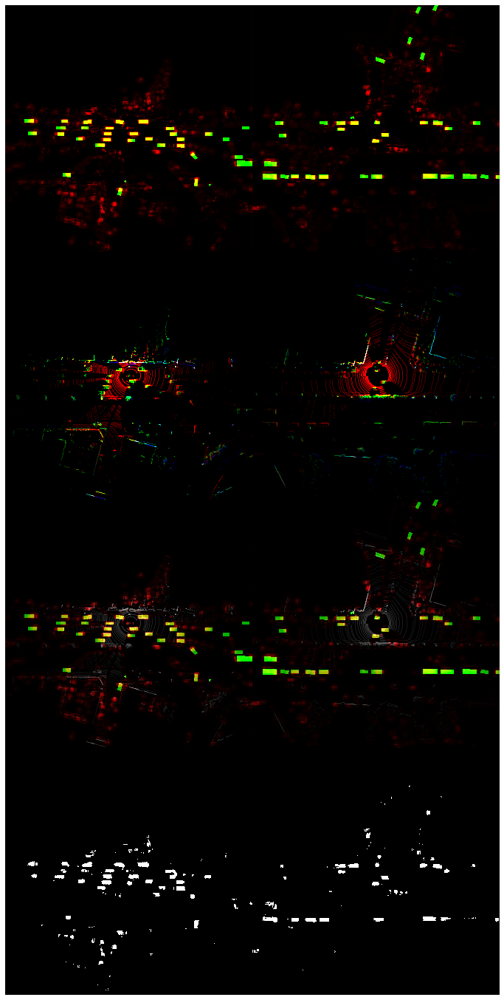


Loss: 0.12321667
Epoch 7


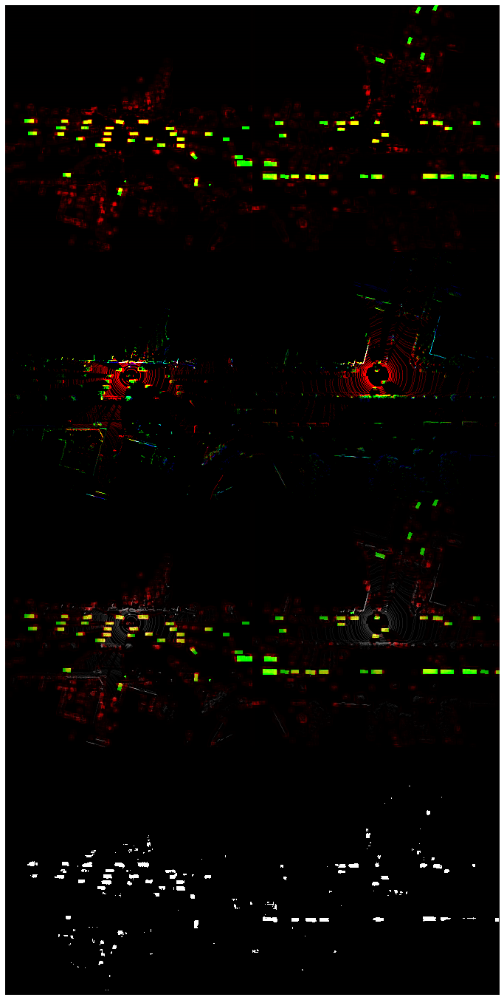


Loss: 0.121541865
Epoch 8


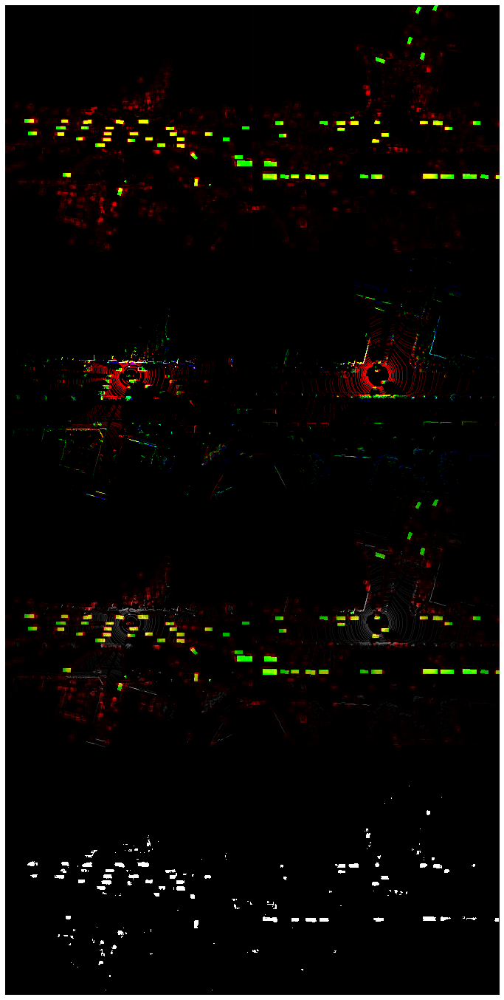


Loss: 0.12024597
Epoch 9


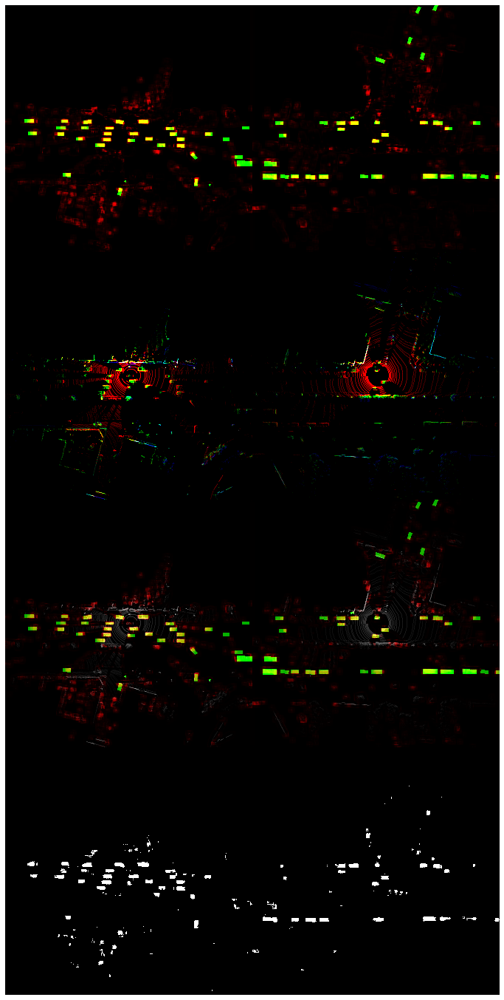


Loss: 0.119235985
Epoch 10


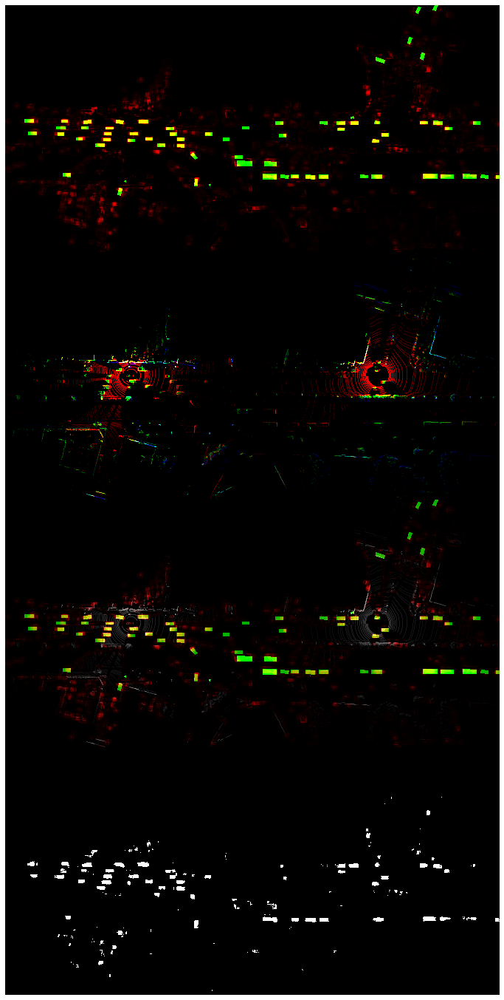


Loss: 0.11840186
Epoch 11


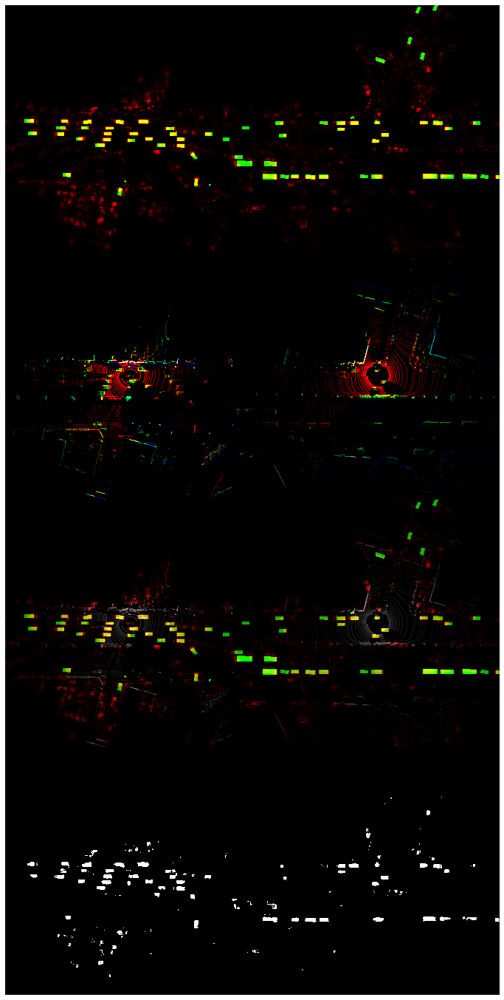


Loss: 0.11769042
Epoch 12


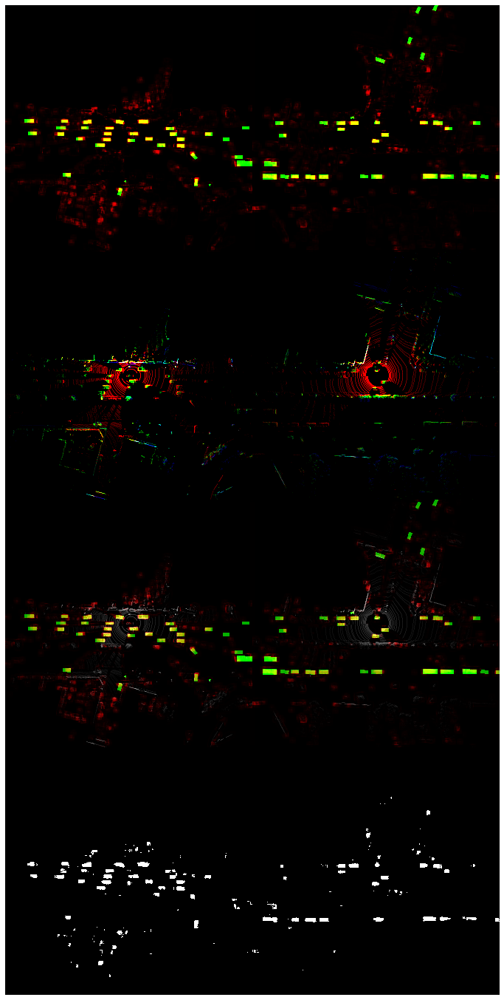


Loss: 0.11705127
Epoch 13


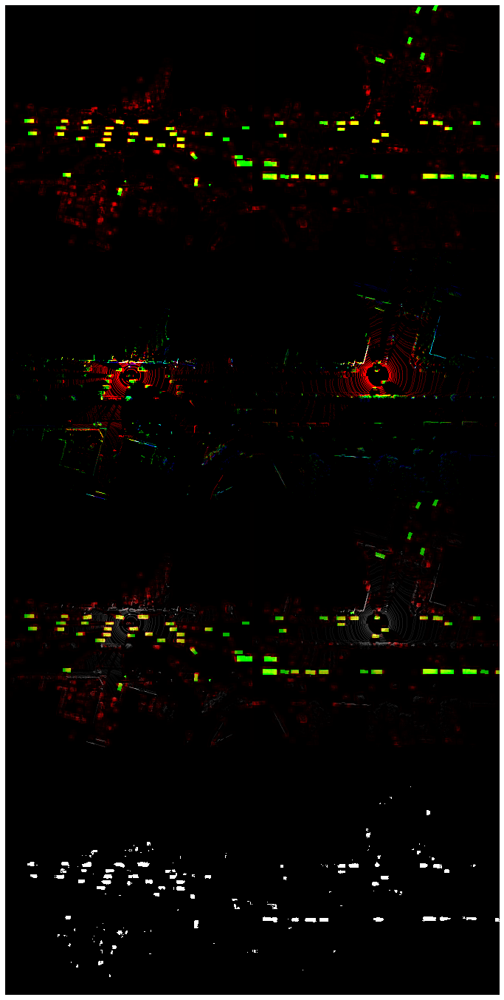


Loss: 0.11656998
Epoch 14


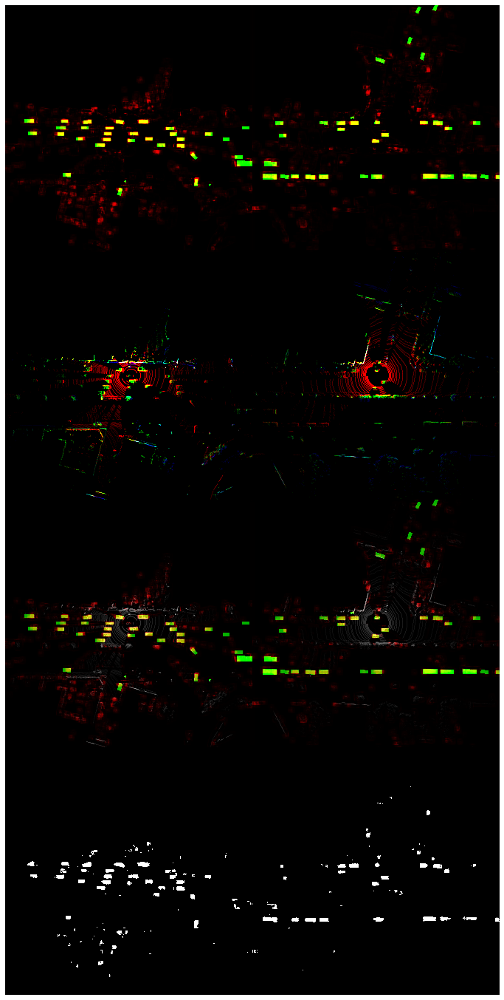


Loss: 0.11603388
Epoch 15


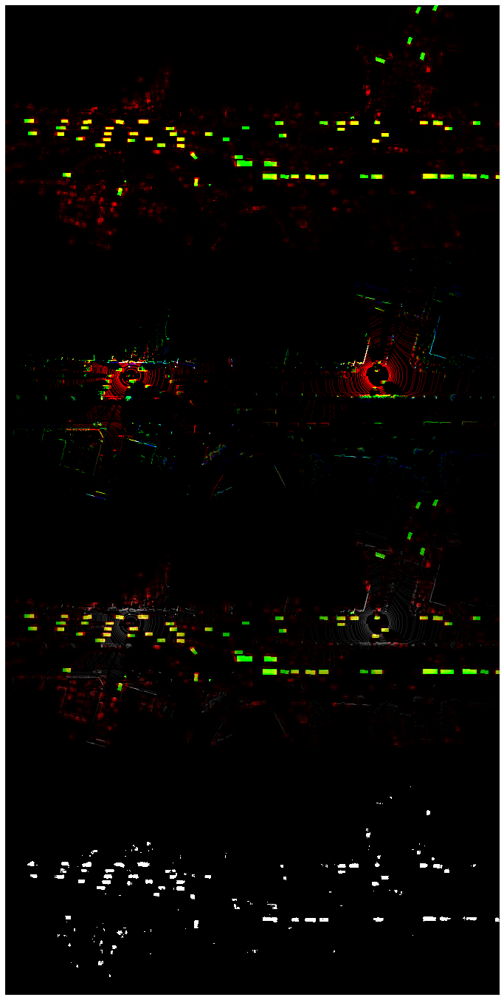


Loss: 0.11562184
Epoch 16


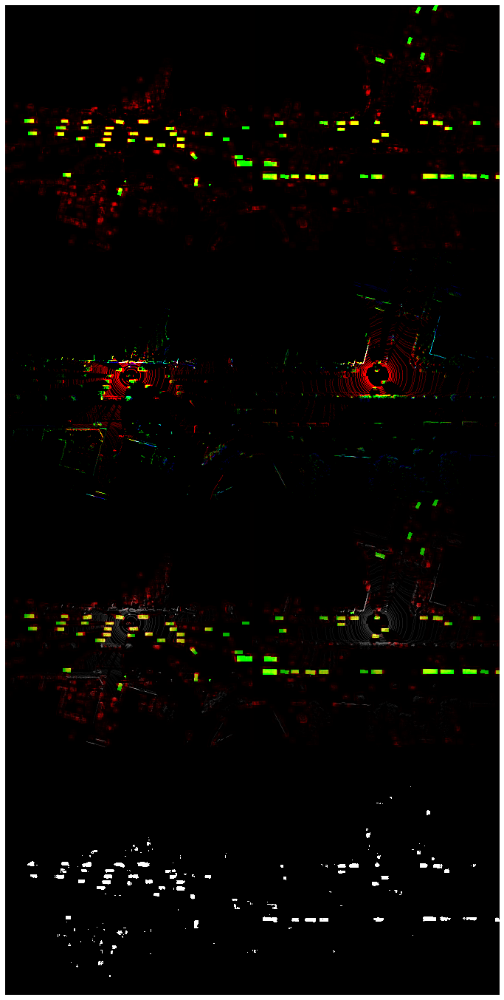


Loss: 0.11527918
Epoch 17


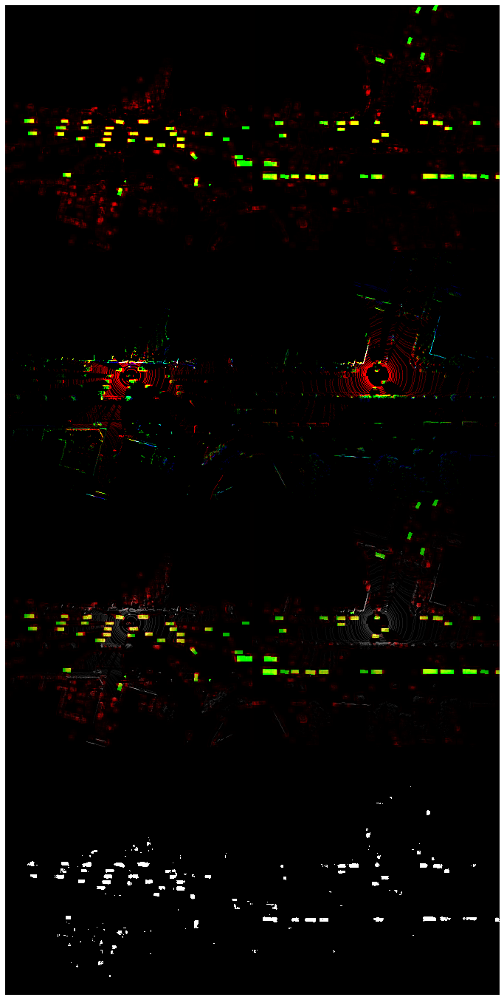


Loss: 0.1149815
Epoch 18


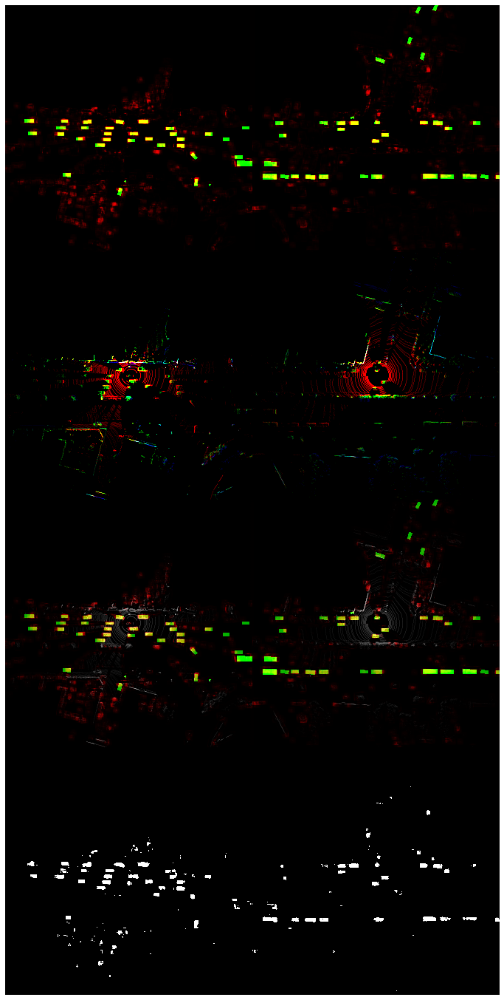


Loss: 0.11471685
Epoch 19


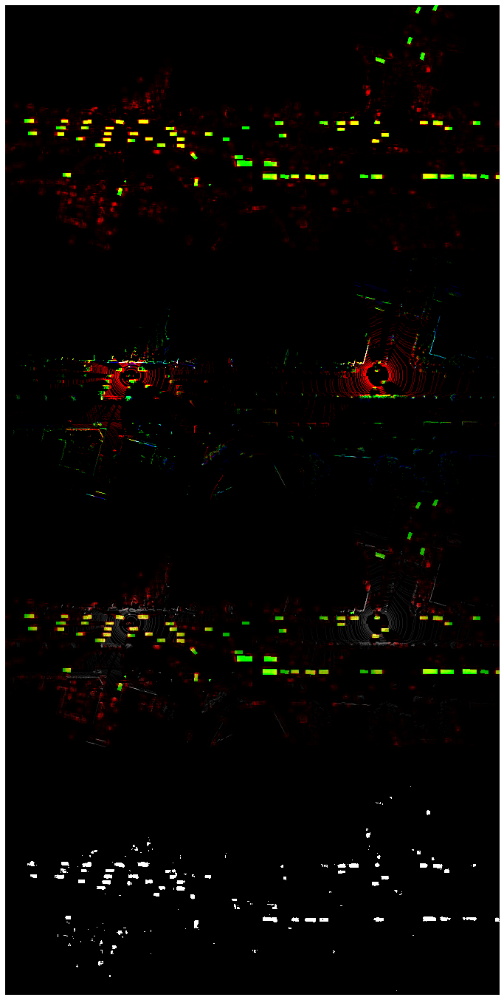


Loss: 0.11448888
Epoch 20


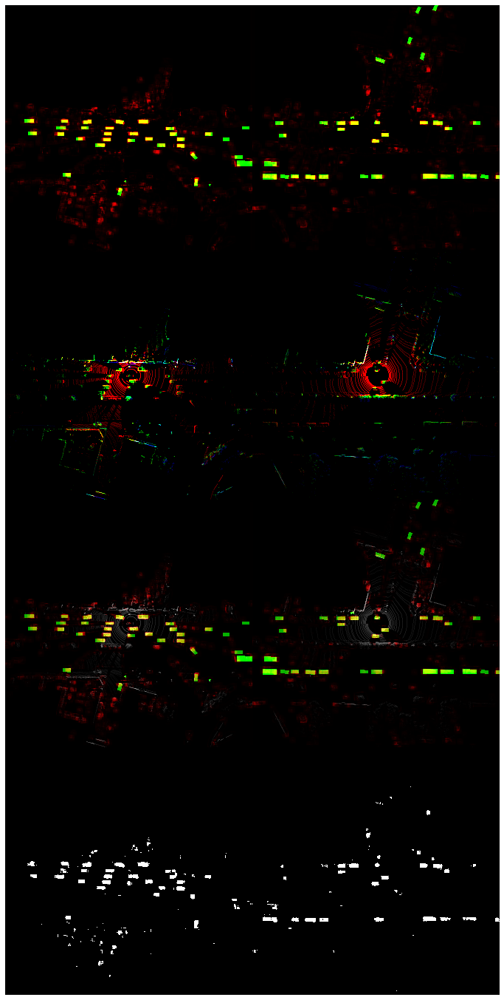


Loss: 0.11429759
Epoch 21


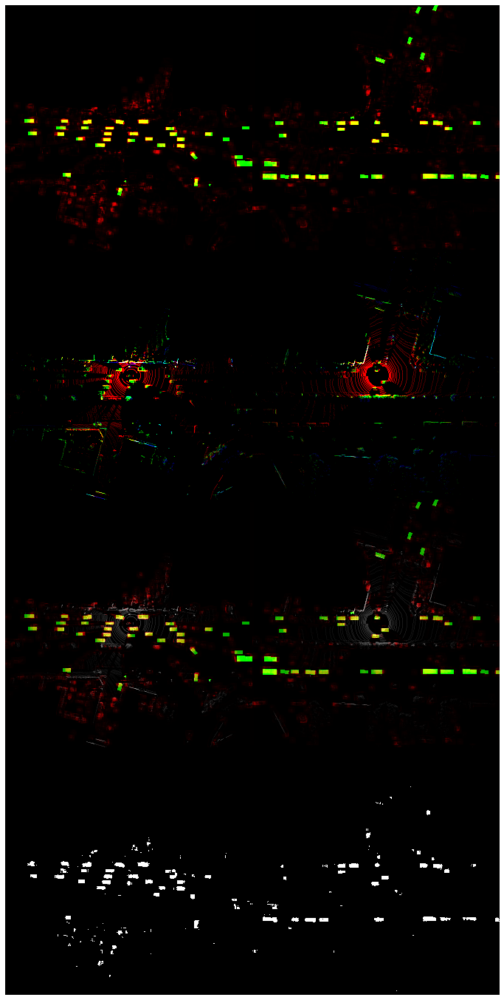


Loss: 0.11407882
Epoch 22


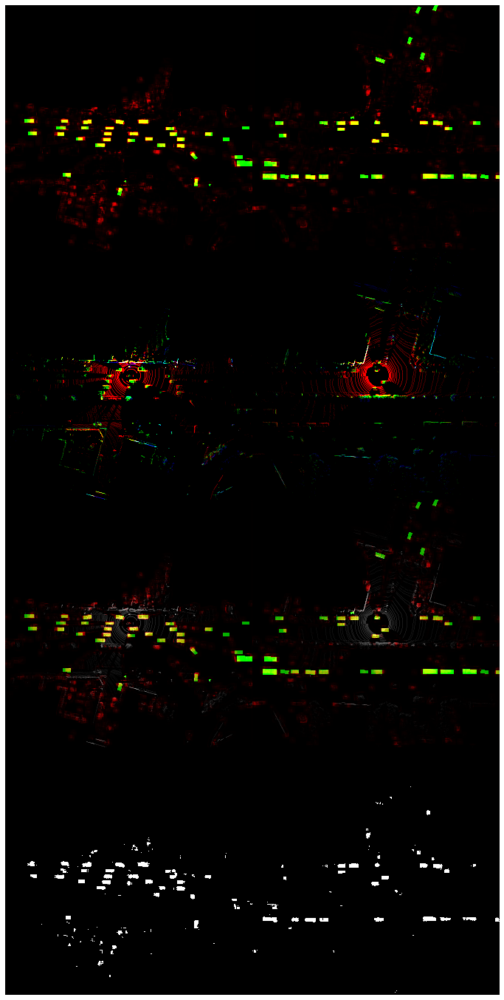


Loss: 0.11388461
Epoch 23


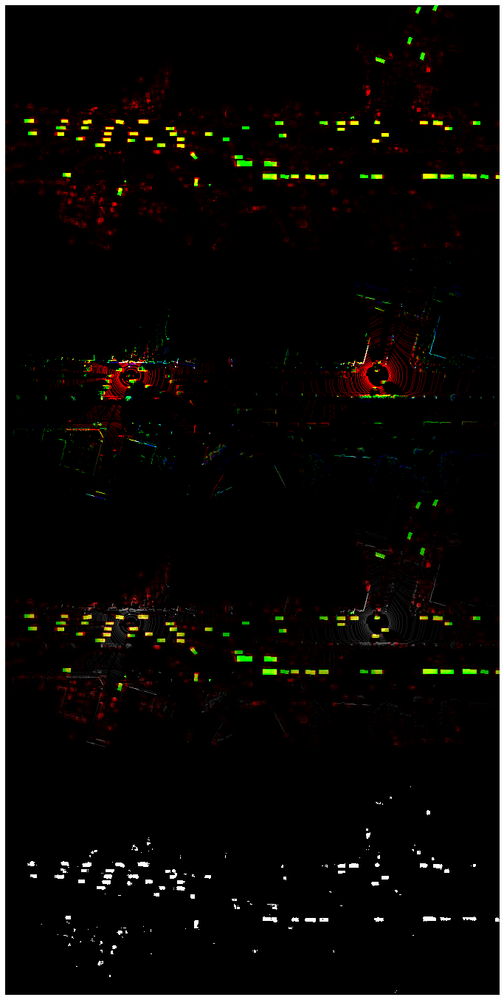


Loss: 0.11369787
Epoch 24


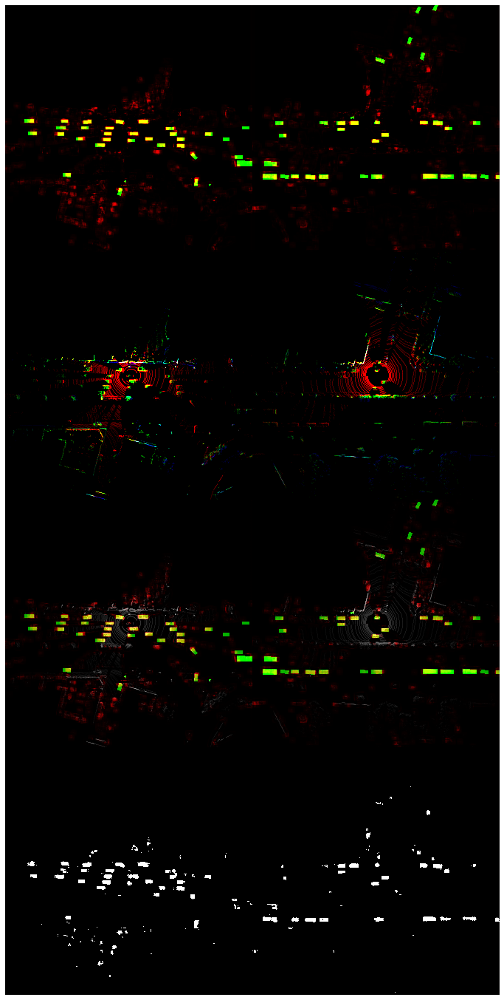


Loss: 0.11353645
Epoch 25


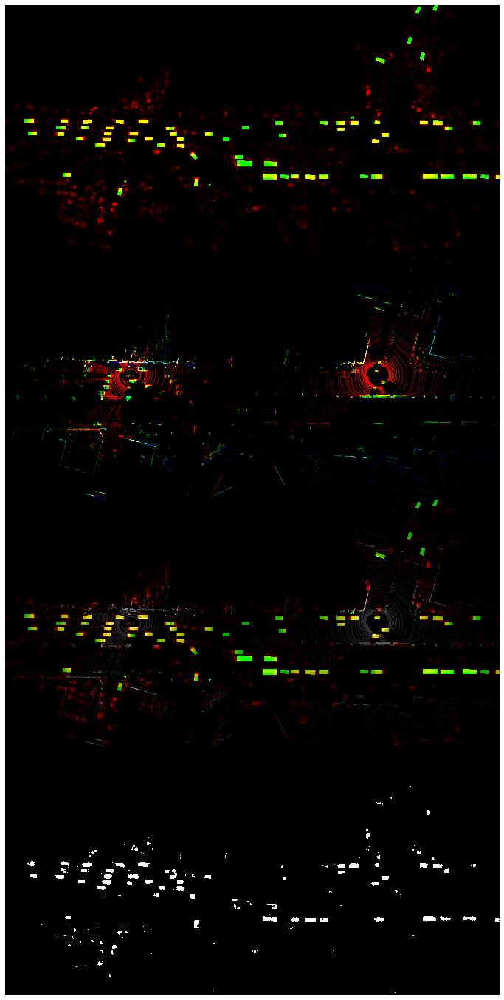


Loss: 0.11338766


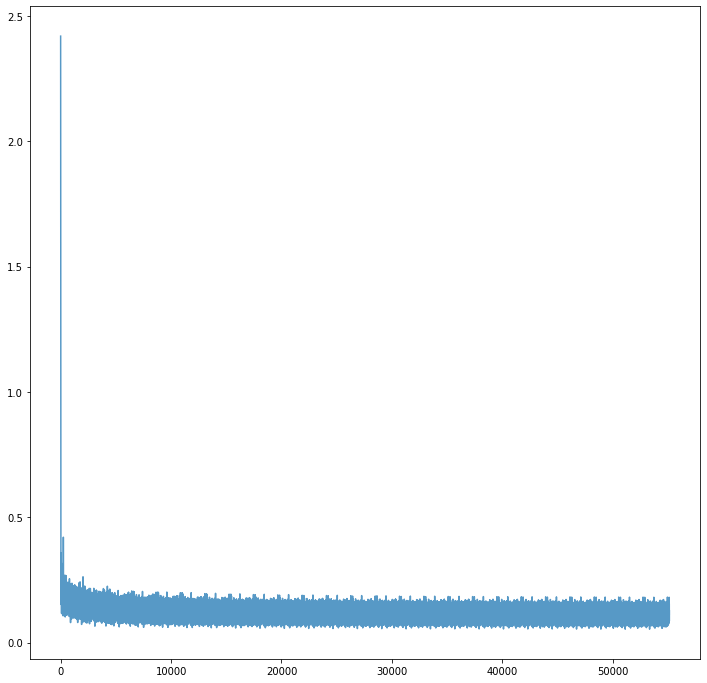

In [26]:
batch_size = 8
epochs = 25 

model = get_unet_model(num_output_classes=len(classes)+1)
model = model.to(device)

optim = torch.optim.Adam(model.parameters(), lr=1e-3)
dataloader = torch.utils.data.DataLoader(train_dataset, batch_size, shuffle=False, num_workers=os.cpu_count()*2)

all_losses = []

for epoch in range(1, epochs+1):
    print("Epoch", epoch)
    
    epoch_losses = []
    progress_bar = tqdm_notebook(dataloader)
    
    for ii, (X, target, sample_ids) in enumerate(progress_bar):
        X = X.to(device) 
        target = target.to(device) 
        prediction = model(X)  
        loss = F.cross_entropy(prediction, target, weight=class_weights)

        optim.zero_grad()
        loss.backward()
        optim.step()
        
        epoch_losses.append(loss.detach().cpu().numpy())

        if ii == 0:
            visualize_predictions(X, prediction, target)
    
    print("Loss:", np.mean(epoch_losses))
    all_losses.extend(epoch_losses)
    
    checkpoint_filename = "unet_checkpoint_epoch_{}.pth".format(epoch)
    checkpoint_filepath = os.path.join(artifacts_folder, checkpoint_filename)
    torch.save(model.state_dict(), checkpoint_filepath)
    
plt.figure(figsize=(12,12))
plt.plot(all_losses, alpha=0.75)
plt.show()

## Validation Set
We use the model checkpoints to see what the validation loss is.

In [27]:
input_filepaths = sorted(glob.glob(os.path.join(validation_data_folder, "*_input.png")))
target_filepaths = sorted(glob.glob(os.path.join(validation_data_folder, "*_target.png")))

batch_size=16
validation_dataset = BEVImageDataset(input_filepaths, target_filepaths)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size, shuffle=False, num_workers=os.cpu_count())


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = get_unet_model(num_output_classes=1+len(classes))
model = model.to(device)

epoch_to_load=25
checkpoint_filename = "unet_checkpoint_epoch_{}.pth".format(epoch_to_load)
checkpoint_filepath = os.path.join(artifacts_folder, checkpoint_filename)
model.load_state_dict(torch.load(checkpoint_filepath))

<All keys matched successfully>

We use cross entropy loss and a softmax activation to get predictions between 0 and 1, something we can interpret as probability.

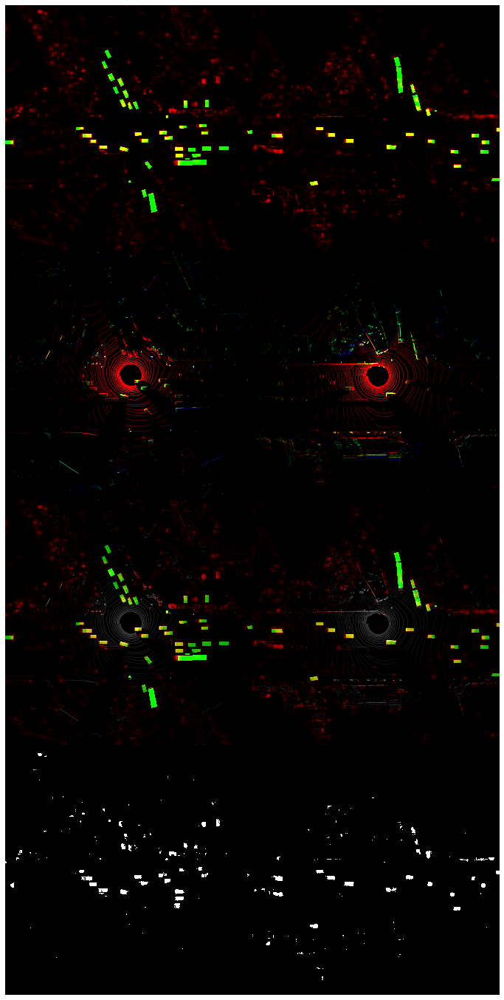

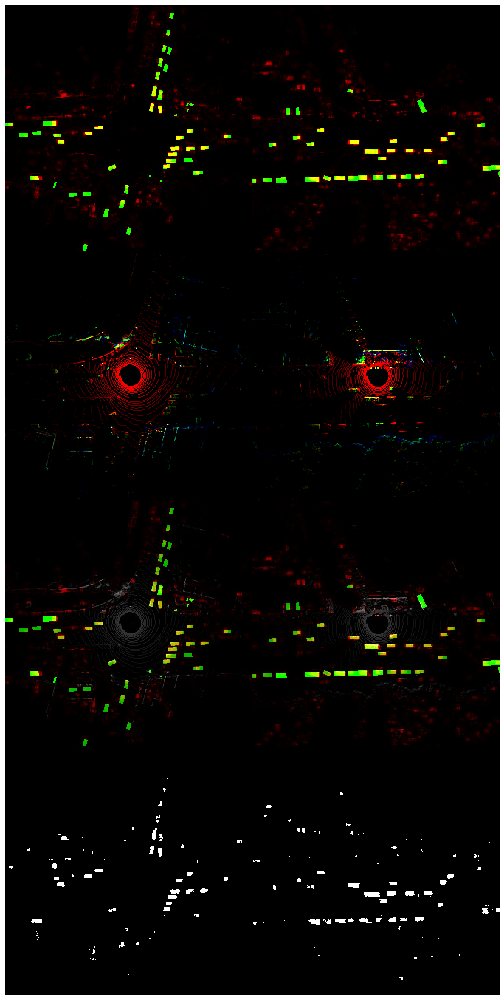


Mean loss: 0.12472529


In [28]:
progress_bar = tqdm_notebook(validation_dataloader)

targets = np.zeros((len(target_filepaths), 336, 336), dtype=np.uint8)

# We quantize to uint8 here to conserve memory. We're allocating >20GB of memory otherwise.
predictions = np.zeros((len(target_filepaths), 1+len(classes), 336, 336), dtype=np.uint8)

sample_tokens = []
all_losses = []

with torch.no_grad():
    model.eval()
    for ii, (X, target, batch_sample_tokens) in enumerate(progress_bar):

        offset = ii*batch_size
        targets[offset:offset+batch_size] = target.numpy()
        sample_tokens.extend(batch_sample_tokens)
        
        X = X.to(device)  # [N, 1, H, W]
        target = target.to(device)  # [N, H, W] with class indices (0, 1)
        prediction = model(X)  # [N, 2, H, W]
        loss = F.cross_entropy(prediction, target, weight=class_weights)
        all_losses.append(loss.detach().cpu().numpy())
        
        prediction = F.softmax(prediction, dim=1)
        
        prediction_cpu = prediction.cpu().numpy()
        predictions[offset:offset+batch_size] = np.round(prediction_cpu*255).astype(np.uint8)
        
        # Visualize the first prediction and a random other one
        if ii == 0:
            visualize_predictions(X, prediction, target, apply_softmax=False)
        if ii == 278:
            visualize_predictions(X, prediction, target, apply_softmax=False)
        
            
print("Mean loss:", np.mean(all_losses))

Training for 25 epochs with depth 5 resulted in mean validation error of 0.066668026

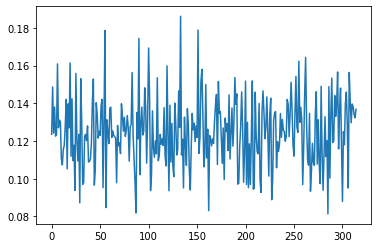

In [29]:
plt.plot(all_losses)

In [30]:
# Get probabilities for non-background
predictions_non_class0 = 255 - predictions[:,0]

/home/brendanliu/anaconda3/envs/tf_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


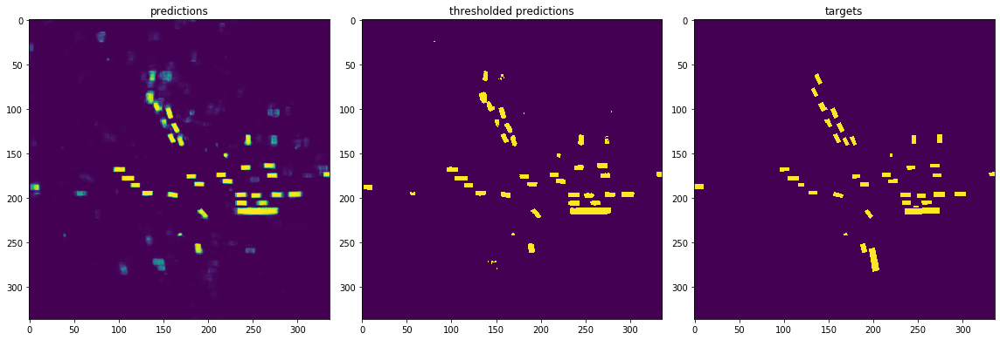

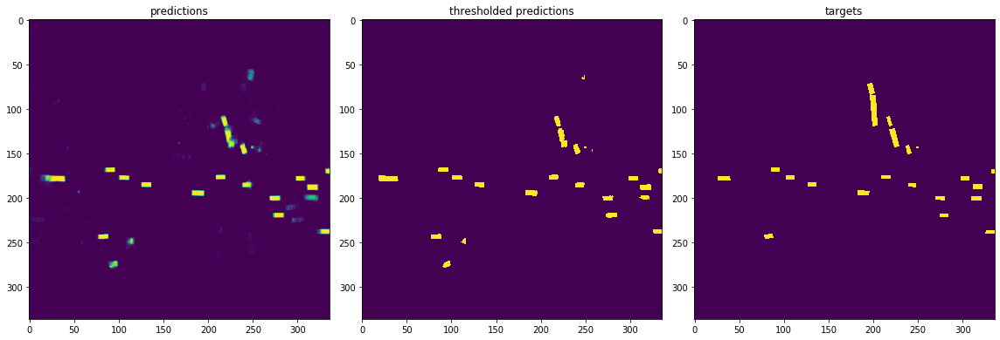

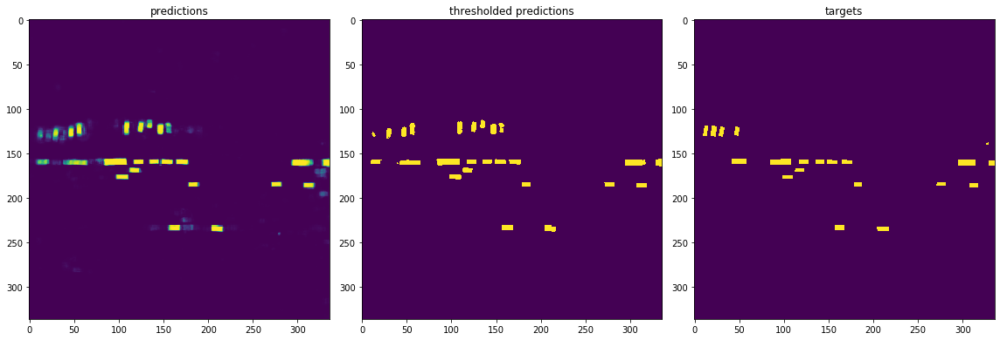

In [31]:
# Arbitrary threshold in our system to create a binary image to fit boxes around.
background_threshold = 255//2

for i in range(3):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 6))
    axes[0].imshow(predictions_non_class0[i])
    axes[0].set_title("predictions")
    axes[1].imshow(predictions_non_class0[i] > background_threshold)
    axes[1].set_title("thresholded predictions")
    axes[2].imshow((targets[i] > 0).astype(np.uint8), interpolation="nearest")
    axes[2].set_title("targets")
    fig.tight_layout()
    fig.show()

100%|██████████| 5040/5040 [00:00<00:00, 7379.28it/s]
/home/brendanliu/anaconda3/envs/tf_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


<Figure size 864x864 with 0 Axes>

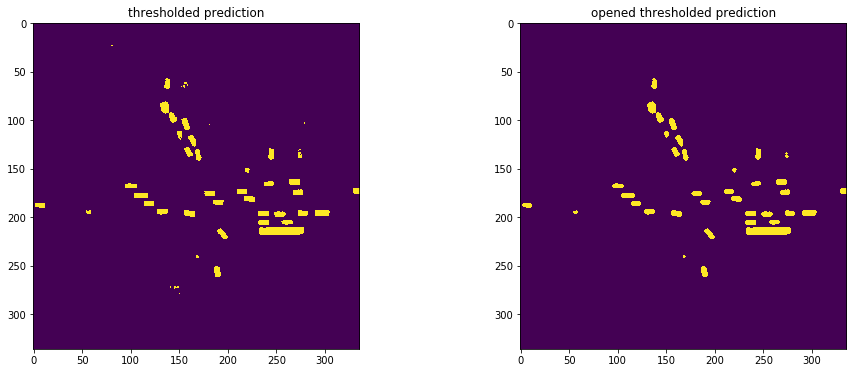

In [32]:
# We perform an opening morphological operation to filter tiny detections
# Note that this may be problematic for classes that are inherently small (e.g. pedestrians)..
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
predictions_opened = np.zeros((predictions_non_class0.shape), dtype=np.uint8)

for i, p in enumerate(tqdm(predictions_non_class0)):
    thresholded_p = (p > background_threshold).astype(np.uint8)
    predictions_opened[i] = cv2.morphologyEx(thresholded_p, cv2.MORPH_OPEN, kernel)

plt.figure(figsize=(12,12))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
axes[0].imshow(predictions_non_class0[0] > 255//2)
axes[0].set_title("thresholded prediction")
axes[1].imshow(predictions_opened[0])
axes[1].set_title("opened thresholded prediction")
fig.show()

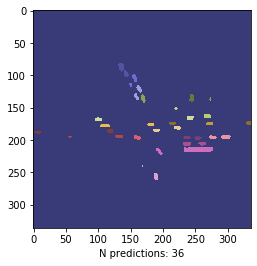

In [33]:
# Sanity check: let's count the amount of connected components in an image
labels, n = scipy.ndimage.label(predictions_opened[0])
plt.imshow(labels, cmap="tab20b")
plt.xlabel("N predictions: {}".format(n))
plt.show()


Total amount of boxes: 147552


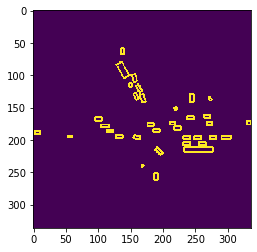

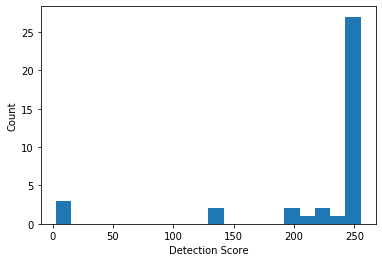

In [34]:
detection_boxes = []
detection_scores = []
detection_classes = []

for i in tqdm_notebook(range(len(predictions))):
    prediction_opened = predictions_opened[i]
    probability_non_class0 = predictions_non_class0[i]
    class_probability = predictions[i]

    sample_boxes = []
    sample_detection_scores = []
    sample_detection_classes = []
    
    contours, hierarchy = cv2.findContours(prediction_opened, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
    
    for cnt in contours:
        rect = cv2.minAreaRect(cnt)
        box = cv2.boxPoints(rect)
        
        # Let's take the center pixel value as the confidence value
        box_center_index = np.int0(np.mean(box, axis=0))
        
        for class_index in range(len(classes)):
            box_center_value = class_probability[class_index+1, box_center_index[1], box_center_index[0]]
            
            # Let's remove candidates with very low probability
            if box_center_value < 0.01:
                continue
            
            box_center_class = classes[class_index]

            box_detection_score = box_center_value
            sample_detection_classes.append(box_center_class)
            sample_detection_scores.append(box_detection_score)
            sample_boxes.append(box)
        
    
    detection_boxes.append(np.array(sample_boxes))
    detection_scores.append(sample_detection_scores)
    detection_classes.append(sample_detection_classes)
    
print("Total amount of boxes:", np.sum([len(x) for x in detection_boxes]))
    

# Visualize the boxes in the first sample
t = np.zeros_like(predictions_opened[0])
for sample_boxes in detection_boxes[0]:
    box_pix = np.int0(sample_boxes)
    cv2.drawContours(t,[box_pix],0,(255),2)
plt.imshow(t)
plt.show()

# Visualize their probabilities
plt.hist(detection_scores[0], bins=20)
plt.xlabel("Detection Score")
plt.ylabel("Count")
plt.show()

Getting ground truth from validation.

In [35]:
from lyft_dataset_sdk.eval.detection.mAP_evaluation import *

def load_groundtruth_boxes(nuscenes, sample_tokens):
    gt_box3ds = []

    # Load annotations and filter predictions and annotations.
    for sample_token in tqdm_notebook(sample_tokens):

        sample = nuscenes.get('sample', sample_token)
        sample_annotation_tokens = sample['anns']

        sample_lidar_token = sample["data"]["LIDAR_TOP"]
        lidar_data = level5data.get("sample_data", sample_lidar_token)
        ego_pose = level5data.get("ego_pose", lidar_data["ego_pose_token"])
        ego_translation = np.array(ego_pose['translation'])
        
        for sample_annotation_token in sample_annotation_tokens:
            sample_annotation = nuscenes.get('sample_annotation', sample_annotation_token)
            sample_annotation_translation = sample_annotation['translation']
            
            class_name = sample_annotation['category_name']
            
            box3d = {
                'sample_token':sample_token,
                'translation':sample_annotation_translation,
                'size':sample_annotation['size'],
                'rotation':sample_annotation['rotation'],
                'name':class_name
            }
            gt_box3ds.append(box3d)
            
    return gt_box3ds

gt_box3ds = load_groundtruth_boxes(level5data, sample_tokens)

In [39]:
pred_box3ds = []

for (sample_token, sample_boxes, sample_detection_scores, sample_detection_class) in tqdm_notebook(zip(sample_tokens, detection_boxes, detection_scores, detection_classes), total=len(sample_tokens)):
    sample_boxes = sample_boxes.reshape(-1, 2) # (N, 4, 2) -> (N*4, 2)
    sample_boxes = sample_boxes.transpose(1,0) # (N*4, 2) -> (2, N*4)

    # Add Z dimension
    sample_boxes = np.vstack((sample_boxes, np.zeros(sample_boxes.shape[1]),)) # (2, N*4) -> (3, N*4)

    sample = level5data.get("sample", sample_token)
    sample_lidar_token = sample["data"]["LIDAR_TOP"]
    lidar_data = level5data.get("sample_data", sample_lidar_token)
    lidar_filepath = level5data.get_sample_data_path(sample_lidar_token)
    ego_pose = level5data.get("ego_pose", lidar_data["ego_pose_token"])
    ego_translation = np.array(ego_pose['translation'])

    global_from_car = transform_matrix(ego_pose['translation'],
                                       Quaternion(ego_pose['rotation']), inverse=False)

    car_from_voxel = np.linalg.inv(create_transformation_matrix_to_voxel_space(bev_shape, voxel_size, (0, 0, z_offset)))


    global_from_voxel = np.dot(global_from_car, car_from_voxel)
    sample_boxes = transform_points(sample_boxes, global_from_voxel)

    # We don't know at where the boxes are in the scene on the z-axis (up-down), let's assume all of them are at
    # the same height as the ego vehicle.
    sample_boxes[2,:] = ego_pose["translation"][2]


    # (3, N*4) -> (N, 4, 3)
    sample_boxes = sample_boxes.transpose(1,0).reshape(-1, 4, 3)


    # We don't know the height of our boxes, let's assume every object is the same height.
    box_height = 1.75

    # Note: Each of these boxes describes the ground corners of a 3D box.
    # To get the center of the box in 3D, we'll have to add half the height to it.
    sample_boxes_centers = sample_boxes.mean(axis=1)
    sample_boxes_centers[:,2] += box_height/2

    # Width and height is arbitrary - we don't know what way the vehicles are pointing from our prediction segmentation
    # It doesn't matter for evaluation, so no need to worry about that here.
    # Note: We scaled our targets to be 0.8 the actual size, we need to adjust for that
    sample_lengths = np.linalg.norm(sample_boxes[:,0,:] - sample_boxes[:,1,:], axis=1) * 1/box_scale
    sample_widths = np.linalg.norm(sample_boxes[:,1,:] - sample_boxes[:,2,:], axis=1) * 1/box_scale
    
    sample_boxes_dimensions = np.zeros_like(sample_boxes_centers) 
    sample_boxes_dimensions[:,0] = sample_widths
    sample_boxes_dimensions[:,1] = sample_lengths
    sample_boxes_dimensions[:,2] = box_height

    for i in range(len(sample_boxes)):
        translation = sample_boxes_centers[i]
        size = sample_boxes_dimensions[i]
        class_name = sample_detection_class[i]
        ego_distance = float(np.linalg.norm(ego_translation - translation))
    
        
        # Determine the rotation of the box
        v = (sample_boxes[i,0] - sample_boxes[i,1])
        v /= np.linalg.norm(v)
        r = R.from_dcm([
            [v[0], -v[1], 0],
            [v[1],  v[0], 0],
            [   0,     0, 1],
        ])
        quat = r.as_quat()
        # XYZW -> WXYZ order of elements
        quat = quat[[3,0,1,2]]
        
        detection_score = float(sample_detection_scores[i])

        
        box3d = Box3D(
            sample_token=sample_token,
            translation=list(translation),
            size=list(size),
            rotation=list(quat),
            name=class_name,
            score=detection_score
        )
        pred_box3ds.append(box3d)

## Precisions:
Average precision, precision per class.
## TODO:
get recall precision

Intersection over Union (IoU)

To do the calculation of AP for object detection, we would first need to understand IoU. The IoU is given by the ratio of the area of intersection and area of union of the predicted bounding box and ground truth bounding box.

In [49]:
iou_thresh = 0.5
precisions = recall_precision(gt_box3ds,pred_box3ds,iou_thresh)

In [50]:
precisions[2]

0.20196759217901988

In [40]:
sub = {}
for i in tqdm_notebook(range(len(pred_box3ds))):
    yaw = 2*np.arccos(pred_box3ds[i].rotation[0]);
    pred =  str(pred_box3ds[i].score/255) + ' ' + str(pred_box3ds[i].center_x)  + ' '  + \
    str(pred_box3ds[i].center_y) + ' '  + str(pred_box3ds[i].center_z) + ' '  + \
    str(pred_box3ds[i].width) + ' ' \
    + str(pred_box3ds[i].length) + ' '  + str(pred_box3ds[i].height) + ' ' + str(yaw) + ' ' \
    + str(pred_box3ds[i].name) + ' ' 
        
    if pred_box3ds[i].sample_token in sub.keys():     
        sub[pred_box3ds[i].sample_token] += pred
    else:
        sub[pred_box3ds[i].sample_token] = pred        
    
# sample_sub = pd.read_csv('../3d-object-detection-for-autonomous-vehicles/sample_submission.csv')
# for token in set(sample_sub.Id.values).difference(sub.keys()):
#     print(token)
#     sub[token] = ''


fa87a77bb35a2a886b8b5837c84232327f608af6a19ddd47a54b132b3f5a7d68
d6c55d5cae65335df7d8e1a3074b1b58a64042afce9f2818efed5ab23458a900
cea2ada262ae96c7a224d48e84e9d8a11c29cc4cd87556c5def9cd51c7849ac4
f61cd2706b7fffe64d4ff94d592c2e25618d03daa4d593b3789701ea53ccb345
d4d0cdf2246f2d1112554fbddb75860adfcb5328a9b1f50fcb36a09c67fc41d3
e2168f72e3b299ed2b75c12b3a7be3f651a9f54efe976f0922c8b619424ef1de
eff4116be08c4f5347ce4df99854909254509e6a46fa1541263ee12d59b5f4a7
9fddbde5af3e11053b2b4c11662fbd8b9eaeed5d17317652990cb1cfcbe47033
019b85418502c32ba00768b7d422bbde493f5ef9007c956111ed41d9ca7aa1c7
e5ebd3120e73deb7a69dfe440ebfe0c8a4af77e5b1045a7f11a8428537657ec1
4f5cb34556a97ab20f1bcf4e06ba2d34b5100ff8859eac60a1a8110d1671ceb6
c31734debf28264c6270c21ecac6373199c2296c38187dd4545cecf72ede7f74
4da13e3722d22abdef9aa77ebe5dec0b41f2cecbff70856eb10e5fceb5cbb5a9
a92d2daec5795f8366ff7ae0f62612fd2d832373d7da484d3ebe6643996ef751
4fb7b8448f21610adde68e00ff7dc38691bcf09f717195c5a5efeefc0421233a
dd1179ab06c8cad9d36bc802

93f3add70acd726b3d49074f16b9ebdf9101a4e04edc3dd847b932ca5f956427
58894e3fbeee73c9c9d508c976d17b79fac3e2f356c55397d4e08ff0ff8e5b5c
7f4891b601a3e06c1e3ce6645ee736f8453d5cbe87e010c001320bbc14051252
038e8f18e75e33a8ef965feb71d8d720adc799c0bed21d4b8ba60828f431935e
2264d258faf98af140fa04a160533cdddf45feee098cc0b2f1665f08739f7c8d
7603c849b6da5ddc8af5f308ef9020c3eb4de08326327554d0a4877bd1922d34
2295add45b4e73af3a27c1e92f0c76e6a0e92c2bed30c98eed0c7373746e5b22
034de71364bd9476ad650c195d2580f67e0df080f1656a8e55e74990a1163ec0
8fc14bb1e4d287f9e05609497ae781d99956bf9cf9f2486208afc60ac47c84f3
f016d1d92b061a14fb2482b7637fe159be24a19f0498285647aeceac69a1239c
297b9d058fcc23f50a2e270aa1b59f36b29174442574f91167b95f80535e6a91
eefeae4fc6f16e4748cb4f5cca1092c740e41245b44b0db2bcd6ef0e0857cbf4
60b4d18694a954027b96ed4fe7f56021db118ec44327d0a56ebb7ff7fe46d377
4f9179163a679ccae111efdc284a2b496e1e9adf0ef25b01e675b1e27fb0ce8a
f41bb6a0cc4347a4ac8096de0cf1a5161c2b150c35647a953963bca734c2c3d2
ba01cb479c3be020cf54eda0e

a9f6b2bb6ab7d2257b7a810ea13361eb12127214d07c7d156d9ba36f30cba4e6
5524e8d0cf907b273b70376fd0796d284ed798e51473d80c97c26ccadf8f698d
45ceb9f1d9c2347eb9468445dd7cdf4fdf9519d81af6f7e2a2c73caee6edc9d0
6c6966cc0a11ce74e9743e30b03076df5ed31e3ce96e6f23c7c7d97ed0be55f7
df52ef8cf5c6e09e5a89749cfbd2ddcb4bb410eab4de518bc34fffebeb96d4b2
f5683036e12eb111c95af0bbd49ac7c4e77dee02e823e0be078c9ffa9af19bf6
9424a93ba229446c41b68542faf70f9890051f148e937dd964e9f511bfc56e92
65970204e7a4bdd1eb6f572e63bdbb881bc44ed959dc33f069deda12ebe3757f
b1a3d8fd09b5871885fa66d65b2688ee8318054b8a6a578e6b482c5ba2317378
a6b5a75d42229b7f484e2e1be606f3316cead34b4ae604bcbf0ae5e790d35818
330a209dcf5454d70c7f43776264105a1fe48058207968045b9a9ca1f1ba033e
8b2eca9e92c5d0421c9a352661b8147778355ecf5f05a05b1bcc8a81e73bf5e4
acdb619e2536028545c93caad42da50b5a90740d983fed0e002030660600f58c
22299aa9ca0320a4fd837297d0000528fa84b53f77925ae78de5b12139c63178
b15339f9809ec342a9e46bac59deca9ca3529e2391d98325815a7c35ff0f3983
6ea0bf6064ed5316f4ab41daa

8e9e799e8858d47ba1000ce312ff9ea8b01fa591a4488dd7ac4d2496f6f44ab2
b572885a76fd4c55a88e05b4d9ca2b47f1bc790efdb406dcfac2ba48b0ad1bfb
837530257c842a661fcbda3941fe6a2847a7331a18b9ee58b35b5563da6c4126
9e2fb63391cb985e05e449a785b723031695bbd35349db6f3865f69405a53d84
8acb37a2745006405c474ddfbd41f79953160b9871d2f97bdc6e4d975d3cfc2c
291c079063e3d3582032bcc039d13c751fa362633a49a8d86ef154d466bcf719
cbd490d13ba51dc2ce412ebd8ceaded99e17b305c423bbe30b37049e327b079a
d398fd48b795b1cd4c936dfbf44b4be9f5913c1c1142de43dfc5c278cebc633e
6e05ab5b28335a91163e4f1dfc6fbbca38d8a17f6c333c9cb8b6944e9ded74c8
5f631f869e913be202e216293abe632e354dc7903c4d2b8e8f248857b46c05b8
1adf6239b0ab7e4fe105ede06658d31e9fabb3e72d332230973f89675e20a354
35718bd9f3daa225ff1701499d4924f72e0e9b4c6e2306a782c1b305e79627dc
ae130703ac225132866c80bec6aa62169d594704d5c25e8524ed448c798806d6
fb288672c70f6eb424dff930d1eb239acef01269139425f9395277ed4555bc8e
404a61b5c8c6a16168267cc9beaa3f63e47c62ceb65b2c8353a87e191111708c
0d6a3c901e26e20e2e3eefbfb

ee7a1dbfcbd9cee745884f41e050598d1ddd41e8ee84a7ec6f20e002f1825b05
7d60259663458f5089de6bb64e0686aff572eed6b6422798dda5a6b716c21dad
75377c61fe54b2304745e2a391977d13c98c1c474792e07ec7c71fc90564f3a1
5e0325a1adfa50f9f61fde62b9e5c333f4671ae85cf7f0b6f71727f2cdf50747
1a34a0adb344b92f0b07792acad2ba8f12a965cedd9910c903197beb9832883a
a71817cb77a4233a38d8b4b7691cb52794049b02d455c61de31646261daed085
8e5848e50b7f4acea1d8b0bc1b1384d4dbf5b9d10eb49418b5fb07e5f3d25f40
c9d614fe285fe8115a4bf9c5e64a409d9668c5b62ba64d3d1af51af831eaaade
1ce00e76649ae3c93ba90add4df386b97f0df782a1ace13dd505491a54c07178
094e3b350fc19787aa006b80d1411fec783441e5fd37f392dfb26bf114b96abe
ec9f3d5a57b3c3230b1b90d9fa79248cdbf54b781059aa78be180ba8360b1347
492752f6dcec7e375841028da24df12af208cde52513f5cb107c915d453ebdf3
0d6a6ecfa02d094446bbfbd96c3072118b1d296d36d8024e99f22023f7e54e75
7135be49c69f2fddf9eedab9d539fffc101789764b27a8c25ba79ef127f908e6
33c2357001af5ca70bb3d38ed747b987ff797fa35d217b4b126e62d3a6a2a7d3
05171abfe2815492746eefcb2

366170d7251accb176ac80024f22497ac5267c077b1e76c13de37cea8f636cc5
36986271c4a2d349b1fb32abebd8b0e8df6e723faf14e7ab8afc0397906351bc
b4c8626aeb8c20bd37d48117015d7bb6792734706cb9ed6f89e4310069614aab
97ec439d3638d4dcf4943ecfaee5a1a0e4a18ee3a2cfec26914f5d1da4a86504
68320535da2e10fcb32dac37f7e80ae451a58c1db0e3e50d6e197b8da6763173
a8ab0afab6e74dc58f9a717fe72d05f6289b4ff1379977c66c258dfc3466d2fc
a4938a350b3615132922bf2e81f27e9ff4c94cf712a2bfdd77454bffd42b7be9
f893c2c1eed8237e454c8542b8fc17c2ef7de3ad9c9568d595bab95bc5be72df
0f3e54de5b3997d4e05e6138408181d2472af95aa973041325073d78b239ed3f
8b79238a6c448b4679344cbb98445b4f12459ef73b66fdcee4ba9cb6b8f9ef62
6e4a8decf66ef2924778b9577384910d9234046092afc9a557c43dc4ed38a608
5ed57b152b981f537d47b64b6acb0624d613eb7ad18311b56340afb21b0ea263
3910204c0edcf3393e0f14e94abfb84c2913499800a9f08717b6b580b274d373
4b75eab170e809ed66bf0a8ddb4419d32e8520c038e90717dca0af7cf7fe9ffa
9a0be83306300cd4f56cda3e5c1687f15ac84c5b21eda2596950b4073d2d6702
d5f4765c2b98737e965256a84

3caef33652cab53cf081072c4cd2c60bfd4f1f7dcd41212280430983c188e5ea
fe9de47c6efb5d36247ab6eb4c4bd3d9fb68b530465ebc86c82c683724aa88a0
419f042807b9d46664755894b48ff6abecf1ff8fab4bd1016d45971e250dc22f
44a8dee45da57b1a5f5200c4195803165384599e66d8d62c793c072eb42bbfcb
548346744f5c00e30acbbdd18f761a4bc67f8631e590b390fc338a35ae4a28d7
2da7d16ca7ce63e2f9f3aec59a922cfd2030b1595abdfaaee1e2286116370534
007c7b2c417ecb81606d8c7f254d65c7b55511d50c8946b1054bbb94da336e8a
7dc9e25c594a2aec684c3c1dd00e2c078ba3039064881c0cb21005688b7558f8
7da99f6c60a8bcf3f6f000458423e8742daccd29a2fe415520bec4f0a66d4ad5
87281645fcd076de8e6f2d6f370d615f0cb865a8ed1f3e7dd652600d94db4baf
3951fe6e89d5c71683120b85ee42268b50bc78415212768da7e1dc3ede2ad069
809e3a1627931000e39cd010cec705ce872aeca01f3ce44d0809a3df142ea0af
e3b7d01a3d6d3449a2326c3fbd2e1f137f6e810a5b8a493eb16e7ae8e63c304d
4391f16c5a139df600ba7d118f0f2a3f87a6333c8437d4032ccc52d9a3fbb00e
6367bbfaac058a3c414c56cbde925a2740117d8b637be6988b05d6a987a1e40e
dd8cdf310ff7caf715643e840